In [1]:

import os
import sys
import logging
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import seaborn
import numpy as np
import pandas as pd
import pylab
import sklearn.preprocessing

import scgenome
import scgenome.db.qc
import scgenome.cnplot
import scgenome.cnfilter
import scgenome.cnclones

LOGGING_FORMAT = "%(asctime)s - %(levelname)s - %(message)s"
logging.basicConfig(format=LOGGING_FORMAT, stream=sys.stderr, level=logging.INFO)

sample_ids = [
    'SA1090',
    'SA921',
    'SA922',
]



Download zenodo data using wget:

```
mkdir zenodo_data/
wget https://zenodo.org/record/3445364/files/ov2295_cell_cn.csv.gz?download=1 -O zenodo_data/ov2295_cell_cn.csv.gz
wget https://zenodo.org/record/3445364/files/ov2295_cell_metrics.csv.gz?download=1 -O zenodo_data/ov2295_cell_metrics.csv.gz
```



# Load CN data


In [2]:

cn_data = pd.read_csv(
    'zenodo_data/ov2295_cell_cn.csv.gz',
    dtype={
        'cell_id': 'category',
        'sample_id': 'category',
        'library_id': 'category',
        'chr': 'category',
    })

metrics_data = pd.read_csv(
    'zenodo_data/ov2295_cell_metrics.csv.gz',
    dtype={
        'cell_id': 'category',
        'sample_id': 'category',
        'library_id': 'category',
    })

scgenome.utils.union_categories([cn_data, metrics_data])


In [3]:

# GC was not included
cn_data['gc'] = 0.5



# Quality filter


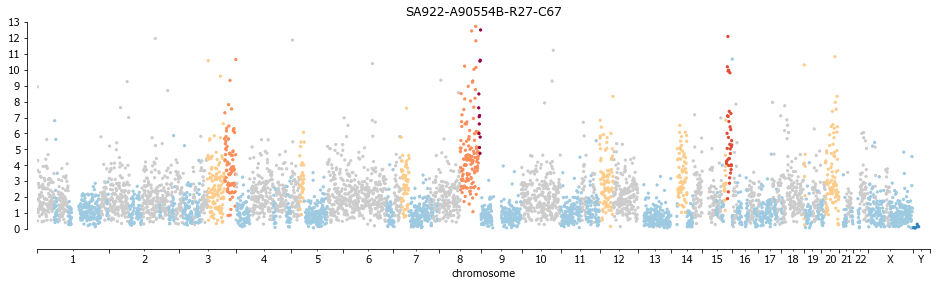

In [6]:

cell_id = metrics_data.query('quality < 0.75')['cell_id'].iloc[10]

plot_data = cn_data.query(f'cell_id == "{cell_id}"').copy()

fig = plt.figure(figsize=(16, 4))
ax = plt.gca()
plt.title(cell_id)
_ = scgenome.cnplot.plot_cell_cn_profile(
    ax,
    plot_data,
    'copy',
    'state',
)



# Read count filter


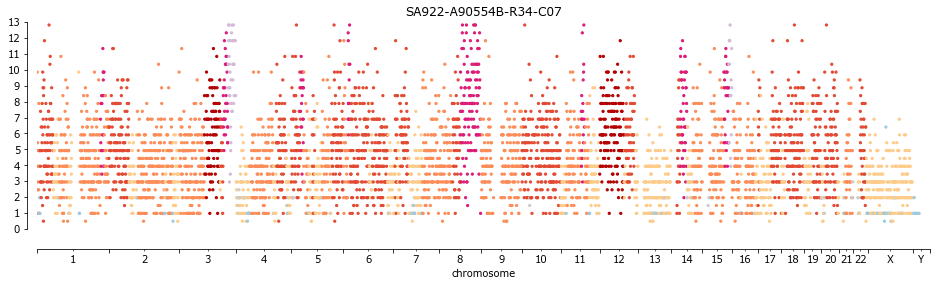

In [7]:

cell_id = metrics_data.query('total_reads < 500000')['cell_id'].iloc[0]

plot_data = cn_data.query(f'cell_id == "{cell_id}"').copy()

fig = plt.figure(figsize=(16, 4))
ax = plt.gca()
plt.title(cell_id)
_ = scgenome.cnplot.plot_cell_cn_profile(
    ax,
    plot_data,
    'copy',
    'state',
)



# Plot PCA components


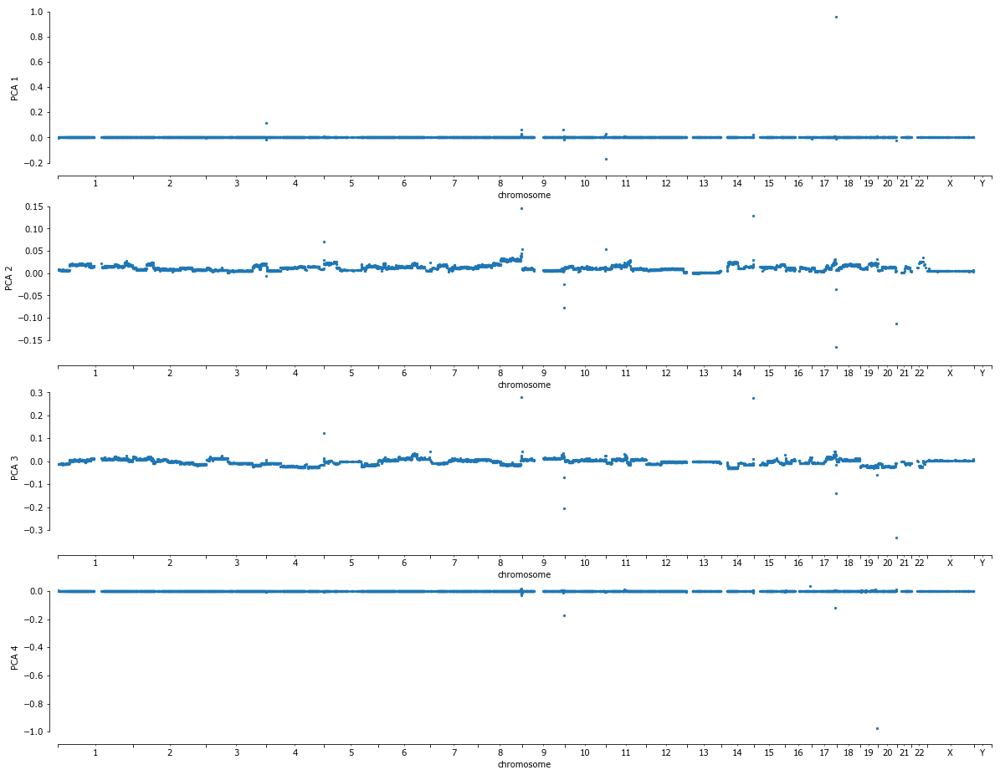

In [11]:

import importlib
scgenome.cnplot = importlib.reload(scgenome.cnplot)
scgenome.cnplot.plot_pca_components(cn_data, n_components=4)



# Calculate clones using hdbscan


2021-11-10 15:44:02,232 - INFO - filtering 1286 of 1966 cells
2021-11-10 15:44:03,002 - INFO - creating copy number matrix
2021-11-10 15:44:06,896 - INFO - clustering copy number
2021-11-10 15:44:12,129 - INFO - merging clusters
2021-11-10 15:44:13,380 - INFO - Plotting cluster cn matrix
2021-11-10 15:44:15,748 - INFO - matrix with size (10, 6206)
/Users/mcphera1/Projects/scgenome/scgenome/cnplot.py:280: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Y = sch.linkage(D, method='complete')
2021-11-10 15:44:15,806 - INFO - Plotting cell cn matrix
/Users/mcphera1/Projects/scgenome/scgenome/cnplot.py:51: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Y = sch.linkage(D, method='complete')
2021-11-10 15:44:27,981 - INFO - Plotting cell cn matrix figure
2021-11-10 15:44:39,795 - INFO - Generating clone data
2

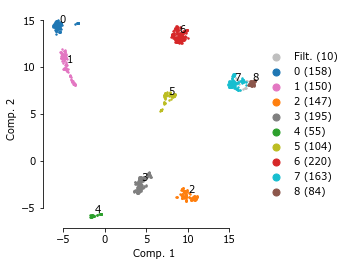

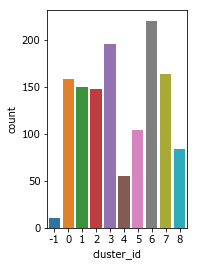

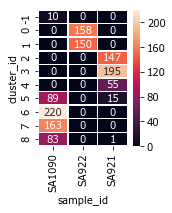

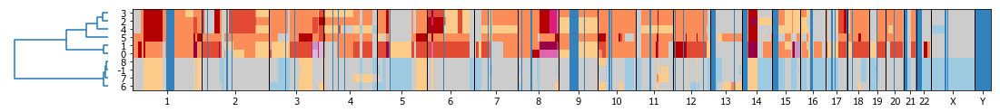

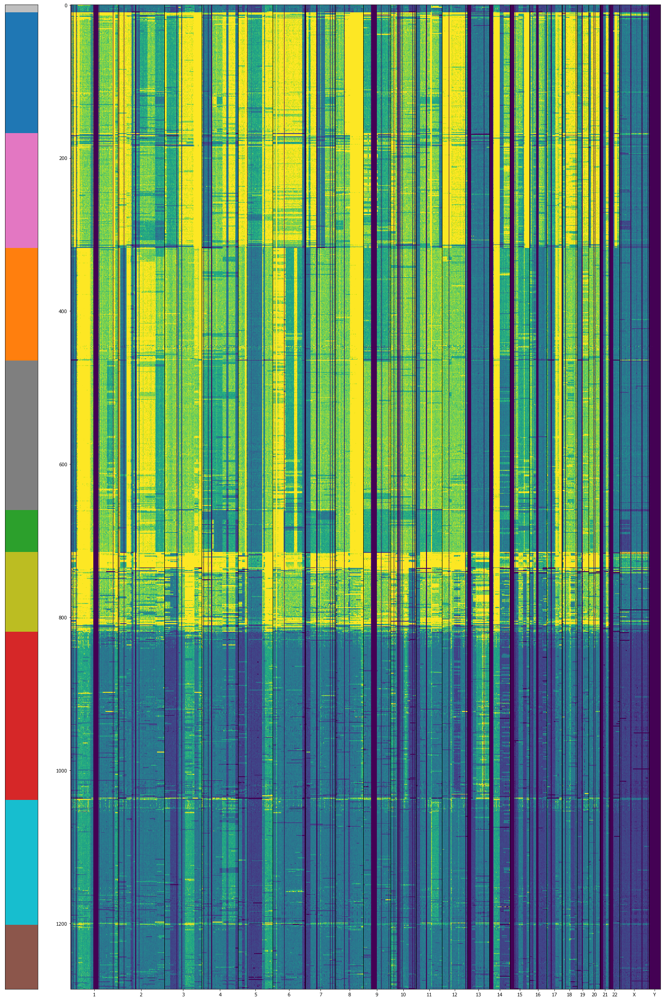

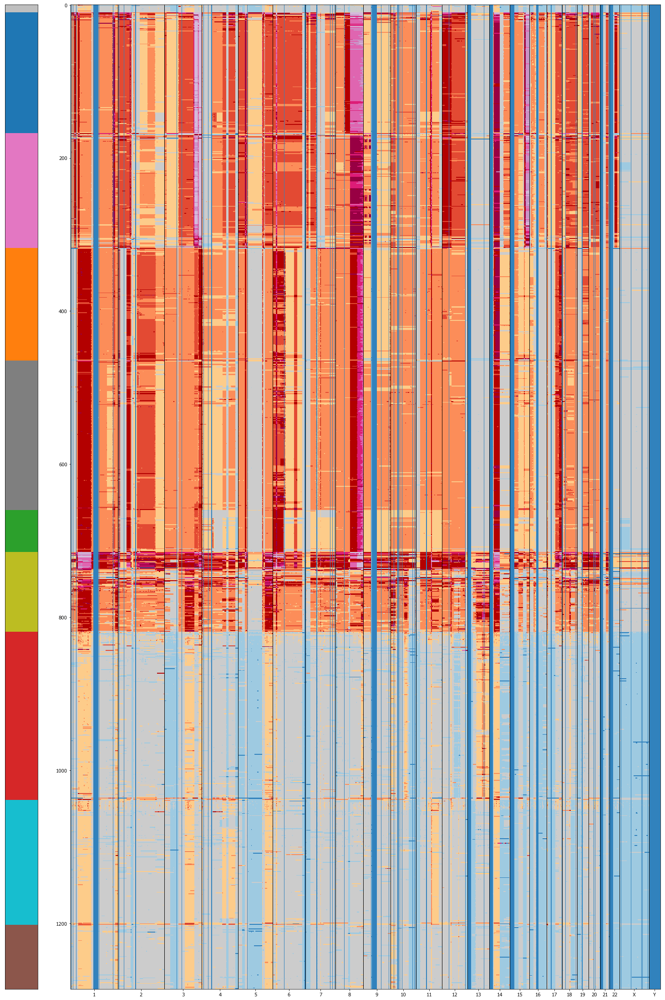

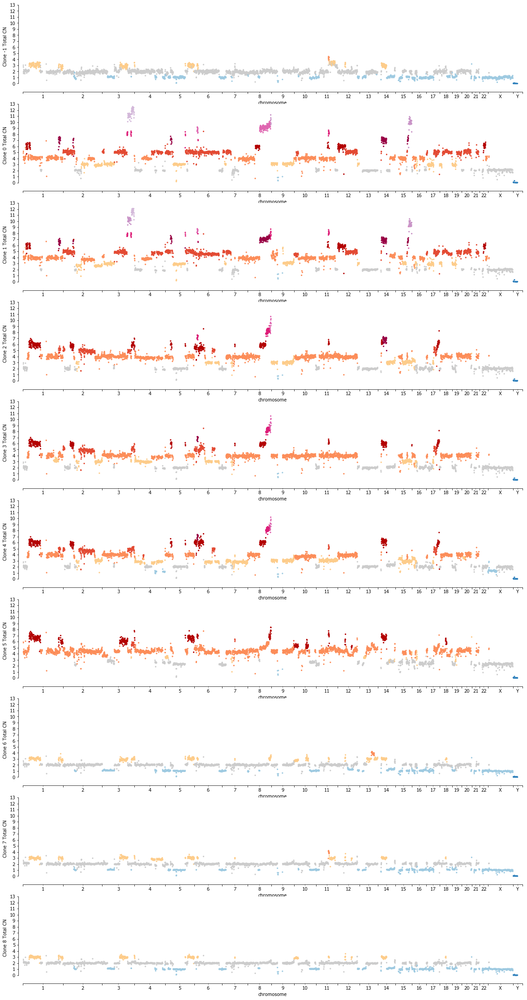

In [25]:

# Remove low quality cells
# Remove low coverage cells
filtered_cells = metrics_data.query('quality > 0.75 and total_reads > 500000')

logging.info('filtering {} of {} cells'.format(
    len(filtered_cells.index), len(metrics_data.index)))
initial_filtered_cn_data = cn_data.merge(filtered_cells[['cell_id']].drop_duplicates())
assert isinstance(initial_filtered_cn_data['cell_id'].dtype, pd.api.types.CategoricalDtype)

clusters = scgenome.cnclones.calculate_umap_hdbscan_clones(
    initial_filtered_cn_data, metrics_data)


In [27]:
scgenome.cnclones.calculate_kmeans_clones??

2021-11-10 17:00:47,810 - INFO - creating copy number matrix
2021-11-10 17:00:52,598 - INFO - clustering copy number
2021-11-10 17:00:52,600 - INFO - trying with max k=30
2021-11-10 17:00:52,600 - INFO - trying with k=2
2021-11-10 17:00:53,808 - INFO - trying with k=3
2021-11-10 17:00:55,210 - INFO - trying with k=4
2021-11-10 17:00:56,905 - INFO - trying with k=5
2021-11-10 17:00:59,296 - INFO - trying with k=6
2021-11-10 17:01:01,868 - INFO - trying with k=7
2021-11-10 17:01:04,838 - INFO - trying with k=8
2021-11-10 17:01:08,090 - INFO - trying with k=9
2021-11-10 17:01:11,532 - INFO - trying with k=10
2021-11-10 17:01:15,083 - INFO - trying with k=11
2021-11-10 17:01:18,596 - INFO - trying with k=12
2021-11-10 17:01:22,639 - INFO - trying with k=13
2021-11-10 17:01:27,062 - INFO - trying with k=14
2021-11-10 17:01:32,040 - INFO - trying with k=15
2021-11-10 17:01:37,371 - INFO - trying with k=16
2021-11-10 17:01:42,678 - INFO - trying with k=17
2021-11-10 17:01:48,317 - INFO - tryi

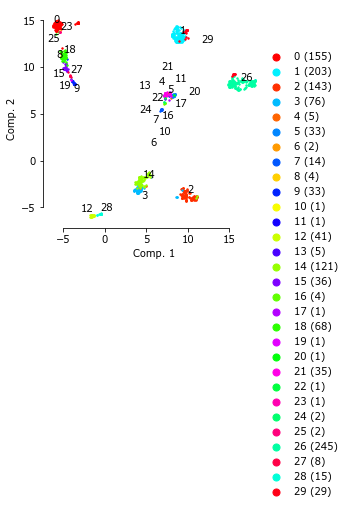

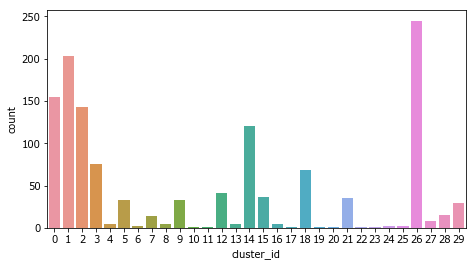

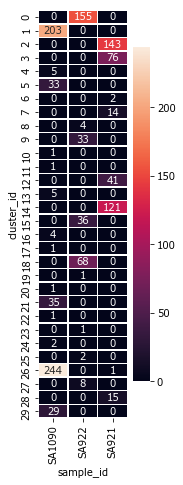

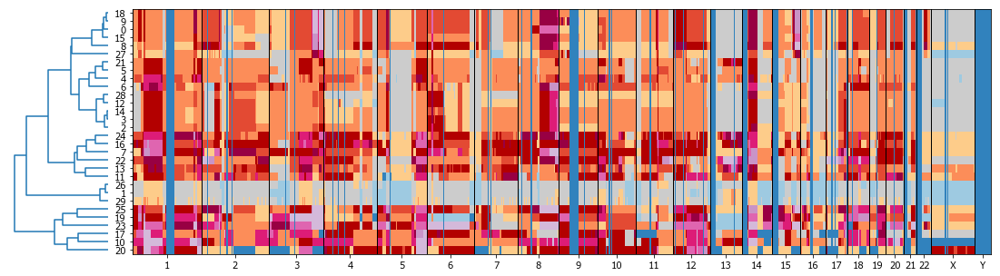

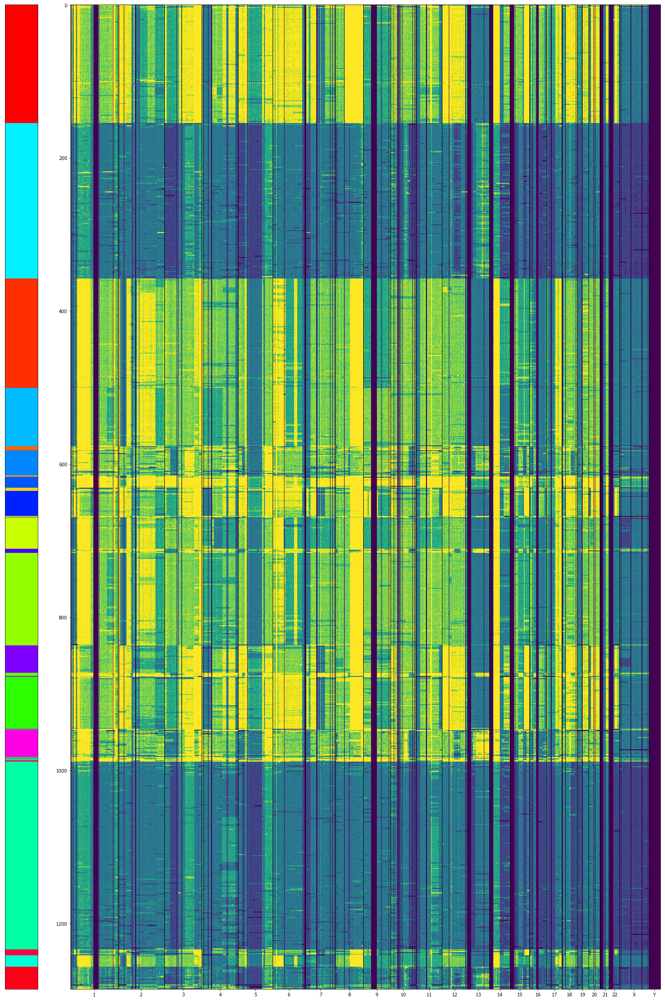

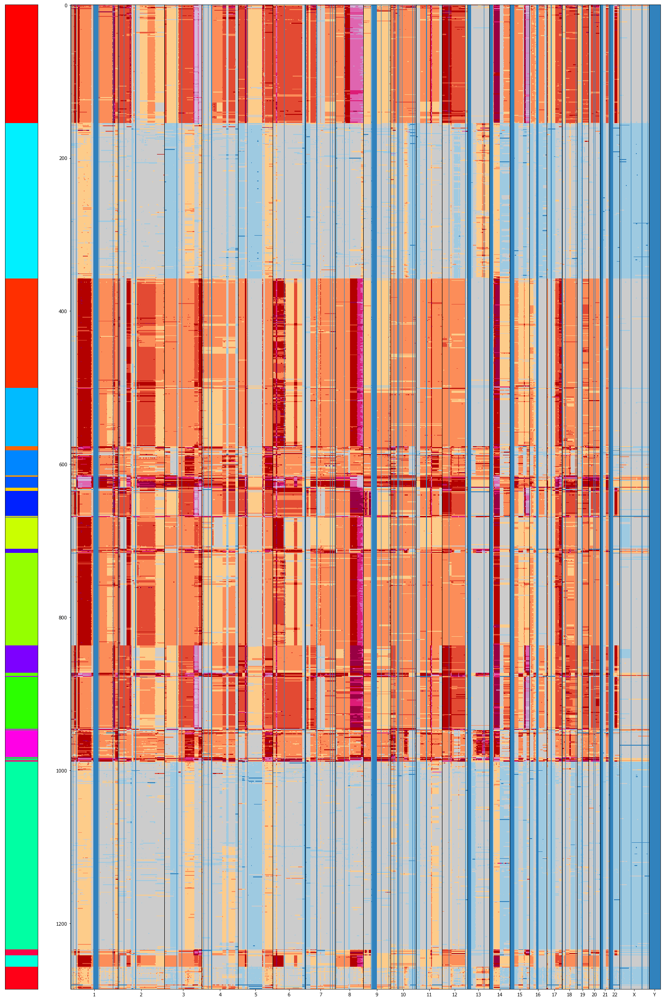

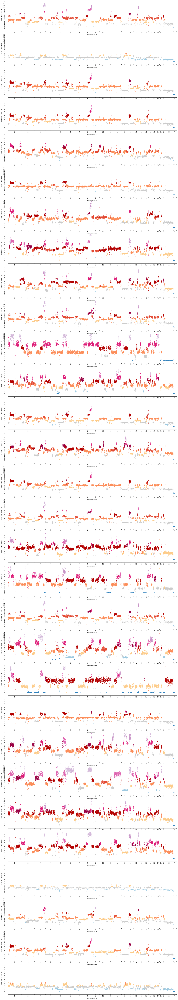

In [28]:

clusters = scgenome.cnclones.calculate_kmeans_clones(
    initial_filtered_cn_data, metrics_data, min_k=2, max_k=30)
